In [1]:
%matplotlib inline
import math
import os 
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as cl
import matplotlib.ticker as mtick
from matplotlib.gridspec import GridSpec
import statsmodels.api as sm
from pandas import ExcelWriter
import pickle
import scipy as sp
import re

In [2]:
def load_object(filename):
    with open(filename, 'rb') as fid:
        file = pickle.load(fid)
    return file

def index(data, label):
    mini = data.reset_index()[data.reset_index()['labels'] == label].index.min()
    maxi = data.reset_index()[data.reset_index()['labels'] == label].index.max()
    return [mini,maxi]

def non_zero_data(data):
    #data = data.drop(columns = "ID")
    non_zero_rows = data.abs().sum(axis=1) > 0.0
    non_zero_data = data[non_zero_rows]
    #non_zero_columns = non_zero_data.abs().sum(axis=0) > 0.0
    #non_zero_data = non_zero_data.loc[: , non_zero_columns]
    return non_zero_data

#put multiple DFs together with the key
def combineddf(dflist, dfkeys, ELEMENTS, noise = None, coefficient = None,):
    #make an empty list
    combinedlist = []
    #make an empty dataframe
    combineddf12 = pd.DataFrame()

    for i,j in zip(dflist, dfkeys):
        if noise == None and coefficient == None:
            df = non_zero_data(i[ELEMENTS])
            #fillnan with 0
            df[np.isnan(df)] = 0
        else:
            #add noise
            df = addnoise(i[ELEMENTS], noise, coefficient)


        df['labels'] = j
        combinedlist.append(df)
        combineddf12 = pd.concat([combineddf12, df])
    return combineddf12

#Counts total number of peaks for each isotope
def marginal_particle(data):
    #replace 0 with nan
    data.replace(0, np.nan, inplace = True)
    return abs(data).count().sort_values(ascending=False)

ELEMENTS = ['48Ti', '51V', '53Cr', '55Mn', '54Fe', '59Co', '60Ni', '63Cu', '64Zn', '69Ga', '72Ge', '75As', '78Se', '85Rb', '88Sr', '89Y', '90Zr', '93Nb', 
           '98Mo', '108Pd', '107Ag', '114Cd', '120Sn', '121Sb', '133Cs', '138Ba', '139La', '140Ce', '152Sm', '153Eu', '158Gd', '159Tb', '164Dy', '165Ho',
           '166Er', '169Tm', '174Yb', '175Lu', '180Hf', '185Re', '192Os', '193Ir', '195Pt', '197Au', '202Hg', '208Pb', '238U']

In [3]:

#returns aggregate particles of a dataset
def aggregate_particles(data, element1 = None):
    total = []
    #go through each row
    for i in data.itertuples():
        labels = []
        #in that row, go through each element
        for j in range(1, len(i)):
            #if there is some value
            if i[j] > 0:
                #append the element into the labels list
                labels.append(data.columns[j - 1])
                #if there is no elements
                if labels[-1] == None:
                    print('ERROR')
        #if there are some elements in the labels list
        if labels != []:
            #append it to the total list
            total.append(labels)
    #make an array of this
    total = np.array(total)
    #only find the unique labels
    uniquelist = np.unique(total)
    
    
    #if element1 is there, focus on that one element
    if element1 != None:
        uniquelist = uniquelist[[element1 in i for i in uniquelist]]
        
    uniquelist1 = []
    #for each unique label
    for i in uniquelist:
        #join them together with a + sign
        uniquelist1.append('+'.join(i))
    totalvalue = []
    # for each unique label
    for i in uniquelist:
        value = 0
        # for each label in total
        for j in total:
            if i == j:
                #count how many there are
                value = value + 1
        totalvalue.append(value)

    finaldf = pd.DataFrame(totalvalue, uniquelist1, columns = ['Value']).sort_values('Value', ascending = False)
    return finaldf

    #returns aggregate particles of a dataset
def aggregate_particles_mod(data):
    total = []
    #go through each row
    for i in data.itertuples():
        labels = []
        #in that row, go through each element
        for j in range(1, len(i)):
            #if there is some value
            if i[j] > 0:
                #append the element into the labels list
                labels.append(data.columns[j - 1])
                #if there is no elements
                if labels[-1] == None:
                    print('ERROR')
        #if there are some elements in the labels list
        if labels != []:
            #append it to the total list
            total.append('+'.join(labels))
    #make an array of this
    total = np.array(total)
    #only find the unique labels
    uniquelist = np.unique(total)
    return total

#returns aggregate particles of a dataset
def aggregate_particles_specific(data, element1 = None):
    total = []
    #go through each row
    for i in data.itertuples():
        labels = []
        #in that row, go through each element
        for j in range(1, len(i)):
            #if there is some value
            if i[j] > 0:
                #append the element into the labels list
                labels.append(data.columns[j - 1])
                #if there is no elements
                if labels[-1] == None:
                    print('ERROR')
        #if there are some elements in the labels list
        if labels != []:
            #append it to the total list
            total.append(labels)
    #make an array of this
    total = np.array(total)
    #only find the unique labels
    uniquelist = np.unique(total)
    
    
    #if element1 is there, focus on that one element
    if element1 != None:
        uniquelist = uniquelist[[element1 in i for i in uniquelist]]
        
    uniquelist1 = []
    #for each unique label
    for i in uniquelist:
        #join them together with a + sign
        uniquelist1.append('+'.join(i))
    totalvalue = []
    # for each unique label
    for i in uniquelist:
        value = 0
        # for each label in total
        for j in total:
            if i == j:
                #count how many there are
                value = value + 1
        totalvalue.append(value)

    finaldf = pd.DataFrame(totalvalue, uniquelist1, columns = ['Value']).sort_values('Value', ascending = False).reset_index()
    return finaldf, total

#Type: Data Frame. From a selected isotope and its particle events, select all other isotopes associated and drop others not associated with it
def isotope_particle(data, isotope):
    obs = data[data[isotope]>0.0]
    return obs

In [4]:
#load the codes
Qian2016codes = load_object('models/multipleLDAmodels/Qian2016codes_5.pkl')
Qian2018codes = load_object('models/multipleLDAmodels/Qian2018codes_5.pkl')
QianU2019codes = load_object('models/multipleLDAmodels/QianU2019codes_5.pkl')
QianR2019codes = load_object('models/multipleLDAmodels/QianR2019codes_5.pkl')
Sourcetrainingcodes = load_object('models/multipleLDAmodels/Sourcesamples_trainingcodes_5.pkl')
Sourcetestingcodes = load_object('models/multipleLDAmodels/Sourcesamples_testingcodes_5.pkl')

Qian2016, Qian2016keys = load_object('models/multipleLDAmodels/Qian2016DF_5.pkl')
Qian2018, Qian2018keys = load_object('models/multipleLDAmodels/Qian2018DF_5.pkl')
QianU2019, QianU2019keys = load_object('models/multipleLDAmodels/QianU2019DF_5.pkl')
QianR2019, QianR2019keys = load_object('models/multipleLDAmodels/QianR2019DF_5.pkl')
Sourcetraining, Sourcekeys = load_object('models/multipleLDAmodels/SourcetrainingDF_5.pkl')
Sourcetesting, Sourcekeys = load_object('models/multipleLDAmodels/SourcetestingDF_5.pkl')

#load mapping feature
m = load_object('models/multipleLDAmodels/randommappingfeature.pkl')

# choose the best model and apply on samples

In [5]:
model2 = load_object('models/multipleLDAmodels/LDAModel_5.pkl')

In [6]:
model2 = model2.fit(Sourcetrainingcodes)

Qian2016prob = model2.transform(Qian2016codes)
maxprob = Qian2016prob.max(axis = 1)
clustermax = Qian2016prob.argmax(axis = 1)

Sourceprob = model2.transform(Sourcetrainingcodes)
Sourcemaxprob = Sourceprob.max(axis = 1)
Sourceclustermax = Sourceprob.argmax(axis = 1)

Sourcetestingprob = model2.transform(Sourcetestingcodes)
Sourcetestingmaxprob = Sourcetestingprob.max(axis = 1)
Sourcetestingclustermax = Sourcetestingprob.argmax(axis = 1)

In [7]:
#save object
def save_object(obj, filename):
    with open(filename, 'wb') as output:  # Overwrites any existing file.
        pickle.dump(obj, output, pickle.HIGHEST_PROTOCOL)

# combine dataframe

In [8]:
Sourcetesting['elements'] = aggregate_particles_mod(Sourcetesting[ELEMENTS])
Sourcetraining['elements'] = aggregate_particles_mod(Sourcetraining[ELEMENTS])

# Get the unique matrix for the cluster for each source

In [9]:
import math
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from itertools import cycle


In [10]:
def sourceclustermax_edit(sampledf,  sourcedf, percentage, ELEMENTS):

    totaldf = pd.DataFrame()
    y_scoredf = pd.DataFrame()
    Binarytestlabelsdf = pd.DataFrame()

    train = sourcedf
    test = sampledf

    #get the elements column in dataframe
    for particle in test['elements'].unique():
        trainingdf = train[train['elements'] == particle]
        testingdf = test[test['elements'] == particle]
        model = KNeighborsClassifier(n_neighbors = int(math.ceil(percentage*len(trainingdf))), weights = 'distance')
        Binarymodel = OneVsRestClassifier(model)
        try:
            model.fit(trainingdf[ELEMENTS], trainingdf['labels'])
            testingdf.loc[:,'Probable Source'] = model.predict(testingdf[ELEMENTS])
            testingdf.loc[:,'Confidence'] = model.predict_proba(testingdf[ELEMENTS]).max()

            BinaryTrainlabels = label_binarize(trainingdf['labels'], classes = Sourcekeys)
            BinaryTestlabels = label_binarize(testingdf['labels'], classes = Sourcekeys)
            Binarymodel.fit(trainingdf[ELEMENTS], BinaryTrainlabels)
            

            y_score = Binarymodel.predict_proba(testingdf[ELEMENTS])
            Binarytestlabelsdf = pd.concat([Binarytestlabelsdf, pd.DataFrame(BinaryTestlabels)])
            y_scoredf = pd.concat([y_scoredf, pd.DataFrame(y_score)])
        except:
            testingdf.loc[:,'Probable Source'] = 'Uncertain'

        totaldf = pd.concat([totaldf, testingdf])
        

    return totaldf, y_scoredf, Binarytestlabelsdf

C:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
C:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

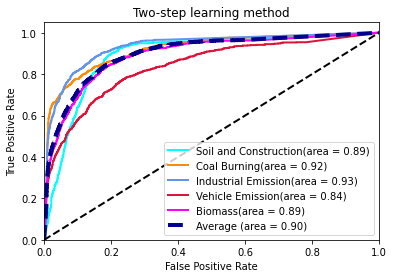

In [11]:
  
Sourcetestingtotaldf, yscoredftest, Btest1 = sourceclustermax_edit(Sourcetesting, Sourcetraining, 0.2,  ELEMENTS)
Sourcetrainingtotaldf, scoredftrain, Btrain1 = sourceclustermax_edit(Sourcetraining, Sourcetraining, 0.2, ELEMENTS)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = len(Sourcekeys)
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Btest1.loc[:, i], yscoredftest.loc[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(np.array(Btest1).ravel(), np.array(yscoredftest).ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

lw = 2

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
df =  pd.DataFrame(index = roc_auc.keys(), data = roc_auc.values())

colors = ['aqua', 'darkorange', 'cornflowerblue', 'crimson', 'magenta']

fig = plt.figure()
# Plot all ROC curves
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
            label= Sourcekeys[i] +  '(area = {1:0.2f})'
            ''.format(i, roc_auc[i]))

plt.plot(fpr["micro"], tpr["micro"], label = 'Average (area = {0:0.2f})'.format(roc_auc['micro']), linestyle='--', linewidth=4, color = 'darkblue')




#plt.plot(fpr["macro"], tpr["macro"], label = 'macro average', linestyle=':', linewidth=4, color = 'blue')

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')

plt.ylabel('True Positive Rate')
plt.title('Two-step learning method')
plt.legend(loc="lower right")
plt.savefig('Figures/ROCcurvesemisupervised.png', dpi = 600)

## Get Metrics

In [12]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

precision_recall_fscore_support(Sourcetestingtotaldf['labels'], Sourcetestingtotaldf['Probable Source'])

C:\Users\garre\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


(array([0.66625464, 0.76359039, 0.73787529, 0.61013444, 0.        ,
        0.60308057]),
 array([0.60493827, 0.67789001, 0.71717172, 0.66217733, 0.        ,
        0.57126824]),
 array([0.63411765, 0.71819263, 0.72737621, 0.6350915 , 0.        ,
        0.58674352]),
 array([891, 891, 891, 891,   0, 891], dtype=int64))

In [13]:
#testing error
len(Sourcetestingtotaldf[Sourcetestingtotaldf['labels'] == Sourcetestingtotaldf['Probable Source']])/len(Sourcetestingtotaldf)

0.64668911335578

In [14]:
#training error
len(Sourcetrainingtotaldf[Sourcetrainingtotaldf['labels'] == Sourcetrainingtotaldf['Probable Source']])/len(Sourcetrainingtotaldf)

1.0

## Making Fe mass figure

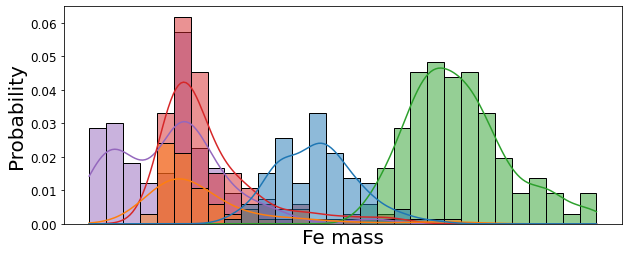

In [15]:
fig = plt.figure(figsize = (10,4))
exampledf = Sourcetesting[Sourcetesting['elements'] == '54Fe']
sns.histplot(x= np.log(exampledf['54Fe']), kde = True, hue = exampledf['labels'], bins = 30, stat = 'probability', legend = False)
plt.xticks([])
plt.xlabel('Fe mass', fontsize = 20)
plt.ylabel('Probability', fontsize = 20)
plt.tick_params(axis = 'y', labelsize = 12)
plt.savefig('Figures/Femassexample.png', dpi = 600)

## Making Mn + Fe Figure

In [16]:
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import ListedColormap
#isolate to 55Mn + 54Fe
exampledf = Sourcetesting[Sourcetesting['elements'] == '55Mn+54Fe']
exampletrainingdf = Sourcetraining[Sourcetraining['elements'] == '55Mn+54Fe']
exampledf, nothing, nothing2 = sourceclustermax_edit(exampledf, exampletrainingdf, 0.2, ELEMENTS)

# Create color maps
cmap_light = ListedColormap(['orange', 'cyan', 'cornflowerblue', 'red', 'magenta'])
cmap_bold = ['darkorange', 'c', 'darkblue', 'crimson', 'magenta']


TrainLabels = LabelEncoder().fit(Sourcekeys).transform(exampletrainingdf['labels'])
model = KNeighborsClassifier(n_neighbors = int(math.ceil(0.2*len(exampletrainingdf))), weights = 'distance')
model.fit(exampletrainingdf[['54Fe', '55Mn']] , TrainLabels)
h = 0.02*10**-14

# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
x_min, x_max = exampledf['54Fe'].min() - 10**-14, exampledf['54Fe'].max() + 2*10**-14
y_min, y_max = exampledf['55Mn'].min() - 10**-14,  exampledf['55Mn'].max() + 10**-14
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                        np.arange(y_min, y_max, h))

Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

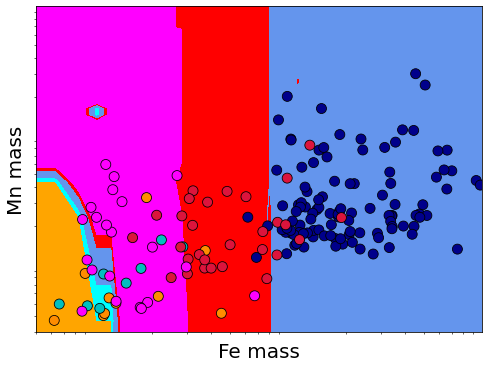

In [17]:
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, cmap = cmap_light)

# Plot also the training points
sns.scatterplot(x=exampledf.sort_values('labels')['54Fe'], y=exampledf.sort_values('labels')['55Mn'], hue=exampledf.sort_values('labels')['labels'], palette = cmap_bold, alpha=1.0, s = 100, edgecolor="black", legend = False)
plt.xlim(5*10**-16, 10**-13)
plt.ylim(3*10**-17, 10**-14)

plt.xscale('log')
plt.yscale('log')

plt.xticks([])
plt.yticks([])
plt.xlabel('Fe mass', fontsize = 20)
plt.ylabel('Mn mass', fontsize = 20)

plt.savefig('Figures/KNNMnFeexample.png', dpi = 600)

# Creating Confusion Matrices

In [18]:
def percSource(totaldf, samplekeys):
    Sourceallocation = []
    for key in samplekeys:
        alloc = np.unique(totaldf[totaldf['labels'] == key]['Probable Source'], return_counts = True)
        perc = alloc[1]/alloc[1].sum()
        Sourceallocation.append([alloc[0], perc, alloc[1]])
    return Sourceallocation

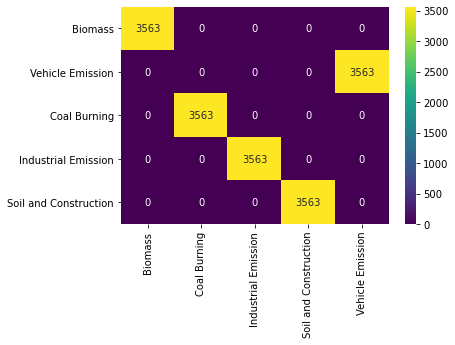

In [19]:
Sourceallocationdf = pd.DataFrame()
for i in percSource(Sourcetrainingtotaldf, Sourcekeys):
    Sourceallocationdf = pd.concat([Sourceallocationdf,  pd.DataFrame(i[2], index = i[0])], axis = 1)
Sourceallocationdf.columns = Sourcekeys
Sourceallocationdf.fillna(0, inplace= True)
Sourceallocationdf = Sourceallocationdf.astype('int').sort_index()

#Sourceallocationdf
cols = Sourceallocationdf.columns.tolist()
cols = ['Biomass', 'Vehicle Emission', 'Coal Burning', 'Industrial Emission', 'Soil and Construction']
Sourceallocationdf = Sourceallocationdf[cols]

sns.heatmap(Sourceallocationdf.T, annot = True, fmt="d", cmap = 'viridis')
plt.savefig('Figures/confusionmatrixsemisupervisedmethodtrain.png', dpi = 300)

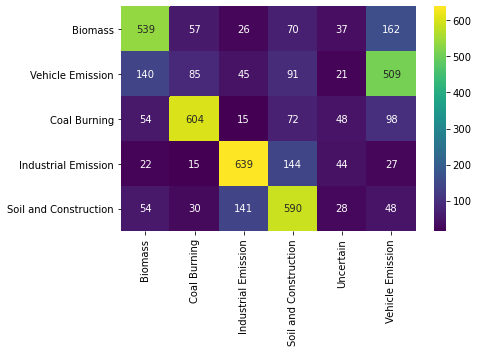

In [20]:
Sourceallocationdf = pd.DataFrame()
for i in percSource(Sourcetestingtotaldf, Sourcekeys):
    Sourceallocationdf = pd.concat([Sourceallocationdf,  pd.DataFrame(i[2], index = i[0])], axis = 1)
Sourceallocationdf.columns = Sourcekeys

#Sourceallocationdf
cols = Sourceallocationdf.columns.tolist()
cols = ['Biomass', 'Vehicle Emission', 'Coal Burning', 'Industrial Emission', 'Soil and Construction']
Sourceallocationdf = Sourceallocationdf[cols]

ax, fig = plt.subplots(figsize = (7, 5))
ax = sns.heatmap(Sourceallocationdf.T, annot = True, fmt="d", cmap = 'viridis')
plt.tight_layout()
plt.savefig('Figures/confusionmatrixsemisupervisedmethodtest.png', dpi = 600)

In [21]:
#let's remove the smallest element and then reinput into the model

df = Sourcetestingtotaldf[Sourcetestingtotaldf['Probable Source'] == 'Uncertain'].reset_index(drop = True)

for ID,minval in enumerate(df[df['Probable Source'] == 'Uncertain'][ELEMENTS].replace(0, np.nan).idxmin(axis = 1, skipna = True)):
    df.loc[ID, minval] = 0

newdf = df.fillna(0)

In [22]:
Sourceallocationdf.loc['Uncertain'].sum()/Sourceallocationdf.sum().sum()

0.03995510662177329

In [23]:
metalcomposition = pd.DataFrame()
Sourcetotaldf = pd.concat([Sourcetestingtotaldf, Sourcetrainingtotaldf], axis = 0)
Sourcetotaldf.reset_index(inplace = True, drop = True)
for i in Sourcekeys:
    df = Sourcetotaldf[Sourcetotaldf['labels'] == i]
    singlemetal = df[df['elements'].str.len() <= 5]
    multimetal = df[df['elements'].str.len()  >= 6]
    metalcomposition = pd.concat([metalcomposition, pd.DataFrame([len(singlemetal), len(multimetal)], index = ['Single Element', 'Multi Element'])], axis = 1)
metalcomposition.columns = Sourcekeys

<ipython-input-24-ee59dca11eb6>:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(metalcomposition.columns, rotation =  45)


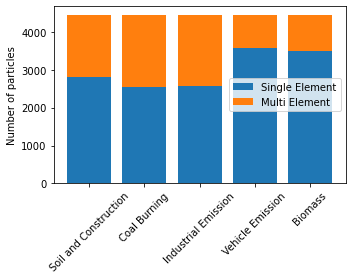

In [24]:
fig, ax = plt.subplots(figsize = (5, 4))
ax.bar(metalcomposition.columns, metalcomposition.T['Single Element'], label = 'Single Element')
ax.bar(metalcomposition.columns, metalcomposition.T['Multi Element'], bottom = metalcomposition.T['Single Element'], label = 'Multi Element')
ax.set_xticklabels(metalcomposition.columns, rotation =  45)
ax.set_ylabel('Number of particles')
plt.legend(loc = 'right')
plt.tight_layout()
plt.savefig('Figures/elementcomposition.png', dpi = 600)

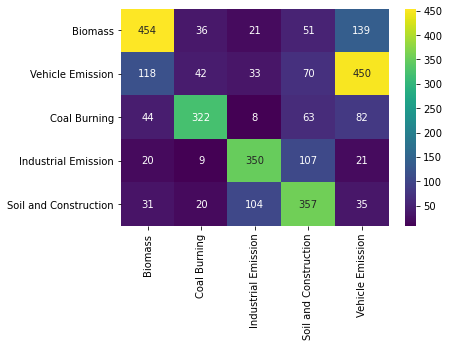

In [25]:
# What's the accuracy for multielements vs single elements

#single elements
singleelements = Sourcetestingtotaldf[Sourcetestingtotaldf['elements'].str.len() <= 5]
#make the confusion matrix
Sourceallocationdf = pd.DataFrame()
for i in percSource(singleelements, Sourcekeys):
    Sourceallocationdf = pd.concat([Sourceallocationdf,  pd.DataFrame(i[2], index = i[0])], axis = 1)
Sourceallocationdf.columns = Sourcekeys

#Sourceallocationdf
cols = Sourceallocationdf.columns.tolist()
cols = ['Biomass', 'Vehicle Emission', 'Coal Burning', 'Industrial Emission', 'Soil and Construction']
Sourceallocationdf = Sourceallocationdf[cols]

sns.heatmap(Sourceallocationdf.T, annot = True, fmt="d", cmap = 'viridis')
plt.savefig('Figures/confusionmatrixsingleelement.png', dpi = 600, bbox_inches = "tight")


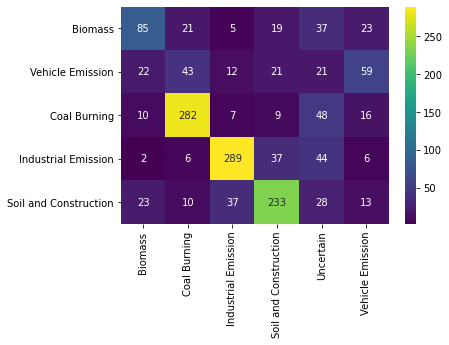

In [26]:
#multiple elements
multielements = Sourcetestingtotaldf[Sourcetestingtotaldf['elements'].str.len() >= 6]
#make the confusion matrix
Sourceallocationdf = pd.DataFrame()
for i in percSource(multielements, Sourcekeys):
    Sourceallocationdf = pd.concat([Sourceallocationdf,  pd.DataFrame(i[2], index = i[0])], axis = 1)
Sourceallocationdf.columns = Sourcekeys

#Sourceallocationdf
cols = Sourceallocationdf.columns.tolist()
cols = ['Biomass', 'Vehicle Emission', 'Coal Burning', 'Industrial Emission', 'Soil and Construction']
Sourceallocationdf = Sourceallocationdf[cols]

sns.heatmap(Sourceallocationdf.T, annot = True, fmt="d", cmap = 'viridis')
plt.savefig('Figures/confusionmatrixsmultielement.png', dpi = 600, bbox_inches = "tight")

C:\Users\garre\anaconda3\lib\site-packages\pandas\core\frame.py:4524: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


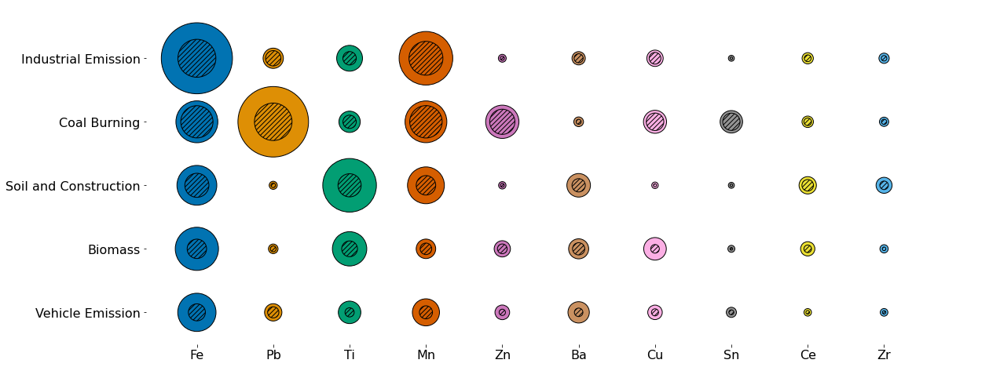

In [27]:
dfmargdf = pd.DataFrame()
dfmultimargdf = pd.DataFrame()
dfmargdf = pd.DataFrame()
dfmultimargdf = pd.DataFrame()

multielements = Sourcetotaldf[Sourcetotaldf['elements'].str.len() >= 6]
for i in Sourcekeys:
    df = Sourcetotaldf[Sourcetotaldf['labels'] == i]
    dfmarg = pd.DataFrame(marginal_particle(df[ELEMENTS]), columns = ['Value'])
    dfmarg['labels'] = i
    dfmarg.reset_index(inplace = True)


    dfmulti = multielements[multielements['labels'] == i]
    dfmultimarg = pd.DataFrame(marginal_particle(dfmulti[ELEMENTS]), columns = ['Multi Value'])
    dfmultimarg['labels'] = i
    dfmultimarg.reset_index(inplace = True)

    sorter = pd.Series(pd.Categorical(dfmultimarg['index'], dfmarg['index'], ordered = True))
    dfmultimarg = dfmultimarg.sort_values('index', key = lambda x: sorter)
    dfmultimarg.reset_index(inplace = True, drop = True)

    dfmultimargdf = pd.concat([dfmultimargdf, dfmultimarg], axis = 0)
    dfmargdf = pd.concat([dfmargdf, dfmarg], axis = 0)

#rename multimargdf columns
dfmultimargdf.columns = ['multi_index', 'Multi Value', 'multilabels']

#concat both df together
overalldf = pd.concat([dfmargdf, dfmultimargdf], axis = 1)

#drop the multi index and multilabels
overalldf.drop(columns = ['multi_index', 'multilabels'], inplace= True)

#strip the numbers from index
overalldf['index'] = [re.sub('[0123456789]', '', i) for i in dfmargdf['index']]

import matplotlib.patches as mpatches

overalldfc = overalldf[overalldf['index'].isin(overalldf.sort_values('Value', ascending = False)['index'].unique()[0:10])].sort_values('Value', ascending = False)

fig = plt.figure(figsize = (20, 6))
ax = fig.add_axes([0, 0, 1, 1], frameon=False, aspect=1.)
ax.set_xlim(0, 20)
ax.set_ylim(0,  8)

xtickID = []
ytickID = []
xticklabel = []
yticklabel = []

for y, element in enumerate(overalldfc['index'].unique()):
    df = overalldfc.loc[overalldfc['index'] == element]
    for x, label in enumerate(overalldfc['labels'].unique()):
        df1 = df.loc[df['labels'] == label]
        xcoord = 1.2 + (y/5) * 9
        ycoord = (4.5 - x % 5)*1.5


        if df1['Value'].values[0] is None:
            p = mpatches.Circle((xcoord,ycoord), radius = 0, facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black')
        else:
            p = mpatches.Circle((xcoord,ycoord), radius = 0.0003* df1['Value'].values[0] + 0.07, facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black')
        
        if df1['Multi Value'].values[0] is None:
            p1 = mpatches.Circle((xcoord,ycoord), radius = 0 , facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black', hatch = '////')
        else:
            p1 = mpatches.Circle((xcoord,ycoord), radius = 0.0003* df1['Multi Value'].values[0] + 0.03 , facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black', hatch = '////')
        ax.add_patch(p)
        ax.add_patch(p1)
        
        if label not in yticklabel:
            ytickID.append(ycoord)
            yticklabel.append(label)

        if element not in xticklabel:
            xtickID.append(xcoord)
            xticklabel.append(element)


        
#fig.patch.set_facecolor('white')
ax.set_xticks(xtickID)
ax.set_xticklabels(xticklabel, fontsize = 16)
ax.set_yticks(ytickID)
ax.set_yticklabels(yticklabel, fontsize = 16)
#ax.yaxis.set_visible(False)
#plt.tight_layout()
plt.savefig('Figures/Circlesfig.png', dpi = 900, bbox_inches = "tight")


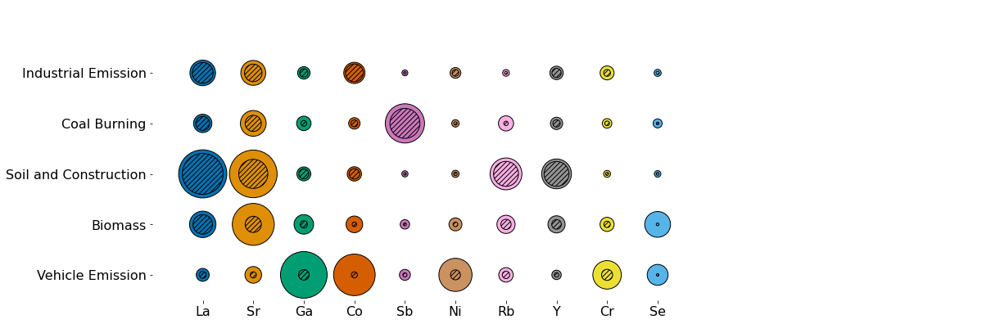

In [28]:
overalldfc2 = overalldf[overalldf['index'].isin(overalldf.sort_values('Value', ascending = False)['index'].unique()[10:20])].sort_values('Value', ascending = False)


fig = plt.figure(figsize = (20, 5))
ax = fig.add_axes([0, 0, 1, 1], frameon=False, aspect=1.)
ax.set_xlim(0, 20)
ax.set_ylim(0,  7)

xtickID = []
ytickID = []
xticklabel = []
yticklabel = []

for y, element in enumerate(overalldfc2['index'].unique()):
    df = overalldfc2.loc[overalldfc2['index'] == element]
    for x, label in enumerate(overalldfc['labels'].unique()):
        df1 = df.loc[df['labels'] == label]
        xcoord = 1.2 + (y/5) * 6
        ycoord = (4.5 - x % 5)*1.2

        #p = mpatches.Circle((xcoord,ycoord), radius = 0.0035* df1['Value'].values[0], facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black')
        #p1 = mpatches.Circle((xcoord,ycoord), radius = 0.0035* df1['Multi Value'].values[0], facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black', hatch = '////')
        #ax.add_patch(p)
        #ax.add_patch(p1)
        
        if df1['Value'].values[0] is None:
            p = mpatches.Circle((xcoord,ycoord), radius = 0, facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black')
        else:
            p = mpatches.Circle((xcoord,ycoord), radius = 0.002* df1['Value'].values[0] + 0.07, facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black')
        
        if df1['Multi Value'].values[0] is None:
            p1 = mpatches.Circle((xcoord,ycoord), radius = 0 , facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black', hatch = '////')
        else:
            p1 = mpatches.Circle((xcoord,ycoord), radius = 0.002* df1['Multi Value'].values[0] + 0.03 , facecolor = sns.color_palette('colorblind')[y], edgecolor = 'black', hatch = '////')
        ax.add_patch(p)
        ax.add_patch(p1)
        if label not in yticklabel:
            ytickID.append(ycoord)
            yticklabel.append(label)

        if element not in xticklabel:
            xtickID.append(xcoord)
            xticklabel.append(element)


        
#fig.patch.set_facecolor('white')
ax.set_xticks(xtickID)
ax.set_xticklabels(xticklabel, fontsize = 16)
ax.set_yticks(ytickID)
ax.set_yticklabels(yticklabel, fontsize = 16)
#ax.yaxis.set_visible(False)
#plt.tight_layout()
plt.savefig('Figures/Circlesfig_minorelements.png', dpi = 900, bbox_inches = "tight")

In [29]:
# Create a column if it is wrong or right
Sourcetestingtotaldf.reset_index(drop = True, inplace = True)
column = []
for ID, particle in enumerate(Sourcetestingtotaldf['labels']):
    if particle != Sourcetestingtotaldf['Probable Source'][ID]:
        column.append(0)
    else:
        column.append(1)

Sourcetestingtotaldf['Correct?'] = pd.Series(column)

<AxesSubplot:>

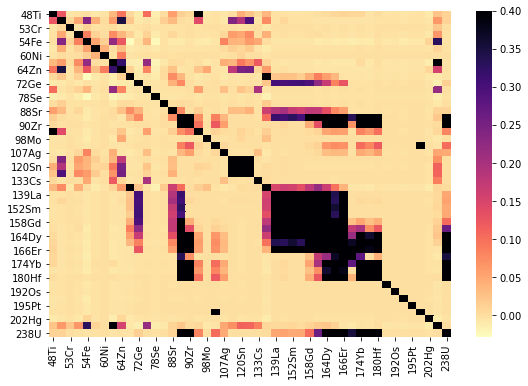

In [30]:
plt.figure(figsize = (9,6))
sns.heatmap(Sourcetestingtotaldf[ELEMENTS].corr(), vmax = 0.4, cmap = 'magma_r')
#cbar = ax.collections[0].colorbar
#cbar.set_ticks([])


In [54]:
# dataframe

wrapparticletypedf = pd.DataFrame()
for source in Sourcekeys:
    df = Sourcetrainingtotaldf[Sourcetrainingtotaldf['labels'] == source]
    dfparticletype = pd.DataFrame(df['elements'].value_counts())
    wrapparticletypedf = pd.concat([wrapparticletypedf, dfparticletype], axis = 1)
wrapparticletypedf.columns = Sourcekeys

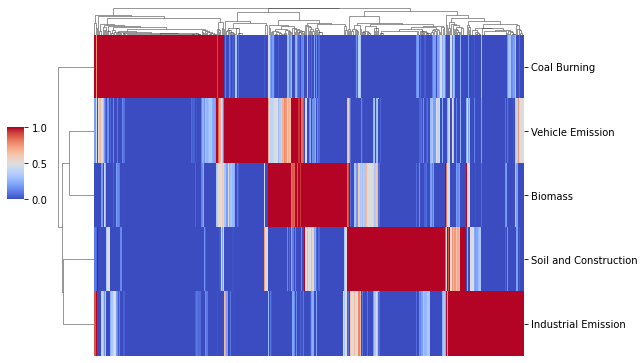

In [82]:
g = sns.clustermap(wrapparticletypedf[wrapparticletypedf[wrapparticletypedf.fillna(0) > 1].sum(axis = 1) != 0].fillna(0).T, standard_scale=1, cmap='coolwarm', 
                   colors_ratio=(0.025, 0.025), 
                   dendrogram_ratio=.08,
                   cbar_pos=(-0.07, .45, .03, .2), xticklabels = '')
# change the figure size after the fact
g.fig.set_size_inches((8,5))
plt.savefig('Figures/clustermap.png',bbox_inches='tight', dpi = 800)

## Misclassification

In [31]:
#Change this so it is just the element particle types getting correct, regardless of labels

dfcorrect = pd.DataFrame()
for source in Sourcekeys:
    #parse to the source
    df = Sourcetestingtotaldf[Sourcetestingtotaldf['labels'] == source]
    for element in df['elements'].unique():
    #parse to the particle type
        df1 = df[df['elements'] == element]
    #how many did it get correct
        percentcorrect = len(df1[df1['Probable Source'] == source])/len(df1)
        dfcorrect = pd.concat([dfcorrect, pd.Series([source,element,percentcorrect, len(df1)])], axis = 1)

dfparticlenumber = dfcorrect.T.pivot(index = 0, columns = 1, values = 3)
dfcorrectpercentage = dfcorrect.T.pivot(index = 0, columns = 1, values = 2)
dfcorrectparticlenumber = dfparticlenumber*dfcorrectpercentage

particletypecorrect = []
for j in dfcorrectpercentage.index:
    for k in dfcorrectpercentage.columns:
        if dfcorrectpercentage.loc[j,k] >= 0.9:
            particletypecorrect.append([j,k, dfcorrectparticlenumber.loc[j,k]])

from pandas import ExcelWriter

def save_xls(list_dfs, xls_path):
    with ExcelWriter(xls_path) as writer:
        for n, df in enumerate(list_dfs):
            df.to_excel(writer,'sheet%s' % n)
        writer.save()

df = pd.DataFrame(particletypecorrect).pivot(columns = 0, values = 1)
compiledparticletypelist = df.apply(lambda x: pd.Series(x.dropna().values))

df = pd.DataFrame(particletypecorrect).pivot(columns = 0, values = 2)
compiledparticlenumberlist = df.apply(lambda x: pd.Series(x.dropna().values))

save_xls([compiledparticletypelist, compiledparticlenumberlist], 'outputdata/particletypecorrect.xlsx')


C:\Users\garre\anaconda3\lib\site-packages\xlsxwriter\workbook.py:336: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


In [32]:
#Change this so it is just the element particle types getting correct, regardless of labels

dfcorrect = pd.DataFrame()
labelscorrect = []
particletypecorrect = []
for element in Sourcetestingtotaldf['elements'].unique():
#parse to the particle type
    df1 = Sourcetestingtotaldf[Sourcetestingtotaldf['elements'] == element]
#how many did it get correct
    percentcorrect = len(df1[df1['Correct?'] == 1])/len(df1)
    dfcorrect = pd.concat([dfcorrect, pd.Series([element,percentcorrect, len(df1), df1['labels'].unique()])], axis = 1)
    if percentcorrect >= 0.9:
        labelscorrect.append(df1['labels'].unique())
        particletypecorrect.append(element)



In [33]:
dfcorrectnew = pd.DataFrame()
for label in Sourcetestingtotaldf['labels'].unique():
    labellist = []
    for correctlabel,correctparticle in zip(labelscorrect, particletypecorrect):
        if label in correctlabel:
            labellist.append(correctparticle)
    dfcorrectnew = pd.concat([dfcorrectnew, pd.DataFrame(labellist)], axis = 1)
    
dfcorrectnew.columns = Sourcetestingtotaldf['labels'].unique()

In [34]:
df = Sourcetestingtotaldf.loc[Sourcetestingtotaldf['elements'].isin(particletypecorrect)]
len(df[df['labels'] == df['Probable Source']])/len(df)

0.9727564102564102

In [35]:
len(Sourcetestingtotaldf.loc[Sourcetestingtotaldf['elements'].isin(particletypecorrect)])/ len(Sourcetestingtotaldf)

0.14006734006734006

In [36]:
for i in Sourcetestingtotaldf['labels'].unique():
    df = Sourcetestingtotaldf[Sourcetestingtotaldf['labels'] == i]
    value = len(df.loc[df['elements'].isin(particletypecorrect)])/ len(df)
    print(i, value)

Soil and Construction 0.07631874298540965
Industrial Emission 0.07295173961840629
Vehicle Emission 0.0707070707070707
Biomass 0.037037037037037035
Coal Burning 0.44332210998877664


In [37]:
for i in Sourcetestingtotaldf['labels'].unique():
    df = Sourcetestingtotaldf[Sourcetestingtotaldf['elements'] == '208Pb']
    value = len(df[df['labels'] == i])/ len(df)
    print(i, value)

Soil and Construction 0.0
Industrial Emission 0.04693140794223827
Vehicle Emission 0.08664259927797834
Biomass 0.007220216606498195
Coal Burning 0.8592057761732852


In [38]:
len(Sourcetestingtotaldf.loc[Sourcetestingtotaldf['elements'].isin(df1.index.tolist())])/ len(Sourcetestingtotaldf)/0.6

0.0

In [39]:
appendthekey = []
for source in df2.columns:
    series = df2[source].isna() == False
    something = df2.loc[df2.index[series]].index
    appendthekey.append(something)

keydf = pd.DataFrame(appendthekey).T
keydf.columns = df2.columns
keydf.to_csv('outputdata/keydf.csv')

NameError: name 'df2' is not defined

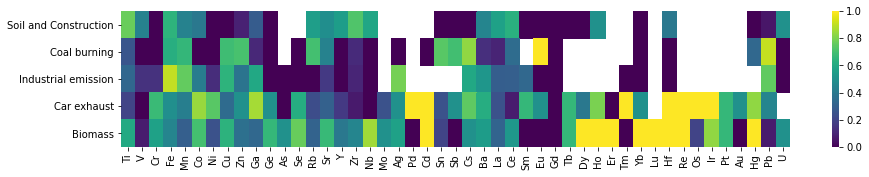

In [ ]:
misclassification = pd.DataFrame()
totalmarg = pd.DataFrame()
for i in Sourcekeys:
    df = Sourcetestingtotaldf[Sourcetestingtotaldf['labels'] == i]
    df1 = df[df['Probable Source'] != i]
    misclassification = pd.concat([misclassification, marginal_particle(df1[ELEMENTS])], axis = 1)
    totalmarg = pd.concat([totalmarg, marginal_particle(df[ELEMENTS])], axis = 1)
misclassification.columns = Sourcekeys    
totalmarg.columns = Sourcekeys

df = 1 - (misclassification/totalmarg)
#sort the index
df = pd.concat([df.iloc[28:, :], df.iloc[:28, :]])

#transpose
df = df.T

df.columns = [re.sub('[0123456789]', '', i) for i in df.columns]

fig = plt.figure(figsize = (15,2.5))
ax = sns.heatmap(df
#[overalldf
#.sort_values('Value', ascending = False)['index'].unique()[:48]],
,cmap = 'viridis')
plt.savefig('Figures/accuracyheatmap.png', dpi = 600, bbox_inches = "tight")

In [ ]:
Sourcetestingtotaldf[Sourcetestingtotaldf['elements'].str.len() >= 6]['Correct?'].sum()/ len(Sourcetestingtotaldf[Sourcetestingtotaldf['elements'].str.len() >= 6])

0.6443046820405312

In [ ]:
len(Sourcetestingtotaldf[Sourcetestingtotaldf['Probable Source'] == 'Uncertain'])/ (len(Sourcetestingtotaldf[Sourcetestingtotaldf['elements'].str.len() >= 6]))


0.1222921034241789

# Get the frequency

In [ ]:
allmatrices = []
#get the uniquematrix for each source
uniquematrix = []
for i in Sourcekeys:
    df1 = Sourcetraining[Sourcetraining['labels'] == i]
    uniquematrix.append(aggregate_particles_specific(df1[ELEMENTS])[0])
allmatrices.append(uniquematrix)

uniquematrixDF = pd.DataFrame()
for dataframelist in allmatrices:
    uniquematrixlistDF = pd.DataFrame()
    for dataframe in dataframelist:
        uniquematrixlistDF = pd.concat([uniquematrixlistDF, dataframe.set_index('index')], axis = 1)
    uniquematrixlistDF.columns = Sourcekeys
    #concat all the particles data together
    uniquematrixDF = pd.concat([uniquematrixDF, uniquematrixlistDF])

# sort by the length of elements. 
uniquematrixDF = uniquematrixDF.sort_index(key=lambda x: x.str.len())

# get 1 element
sourcemax = []
for i in uniquematrixDF.loc[uniquematrixDF.index.str.len() <= 5].iterrows():
    sourcemax.append(Sourcekeys[i[1].argmax()])
df = pd.concat([uniquematrixDF.loc[uniquematrixDF.index.str.len() <= 5], 
    pd.DataFrame(sourcemax, index = uniquematrixDF.loc[uniquematrixDF.index.str.len() <= 5].index)], axis = 1)

df.to_excel('outputdata/unique_matrix.xlsx')

# get 2 elements
highermarg = uniquematrixDF.loc[uniquematrixDF.index.str.len() >= 6]
lowermarg = highermarg.loc[highermarg.index.str.len() <= 11]
sourcemax = []
for i in lowermarg.iterrows():
    sourcemax.append(Sourcekeys[i[1].argmax()])
lowermarg = pd.concat([lowermarg, pd.DataFrame(sourcemax, index = lowermarg.index)], axis = 1)
lowermarg.to_excel('outputdata/unique_matrix2elements.xlsx')

# 3 or more elmeents
df = uniquematrixDF.loc[uniquematrixDF.index.str.len() >= 12]
sourcemax = []
for i in df.iterrows():
    sourcemax.append(Sourcekeys[i[1].argmax()])
df = pd.concat([df, pd.DataFrame(sourcemax, index = df.index)], axis = 1)
df.to_excel('outputdata/unique_matrix3moreelements.xlsx')


<ipython-input-3-999fd287868d>:94: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  total = np.array(total)


## Applying to pm2.5 samples

In [49]:
Sourcekeys = ['Soil and Construction', 'Coal burning', 'Industrial emission', 'Car exhaust', 'Biomass']
Predictedkeys = ['Soil and Construction', 'Coal burning', 'Industrial emission', 'Car exhaust', 'Biomass', 'Uncertain']
Qian2016['elements'] = aggregate_particles_mod(Qian2016[ELEMENTS])
Qian2018['elements'] = aggregate_particles_mod(Qian2018[ELEMENTS])
QianU2019['elements'] = aggregate_particles_mod(QianU2019[ELEMENTS])
QianR2019['elements'] = aggregate_particles_mod(QianR2019[ELEMENTS])

In [97]:
compiledparticletypedf = pd.DataFrame()
for key in Sourcekeys:
    particletypelist = compiledparticletypelist[key].unique()
    Qian2016.reset_index(drop = True, inplace = True)
    keydf = Qian2016[Qian2016['elements'].isin(particletypelist)]
    keydf['assignedsource'] = key
    compiledparticletypedf = pd.concat([compiledparticletypedf, keydf], axis = 0)

uncertaindf = Qian2016[~Qian2016.index.isin(compiledparticletypedf.index)]
uncertaindf['assignedsource'] = 'Uncertain'

compiledparticletypedf = pd.concat([compiledparticletypedf, uncertaindf], axis = 0)




<ipython-input-97-9a07f8b065e7>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  keydf['assignedsource'] = key
<ipython-input-97-9a07f8b065e7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uncertaindf['assignedsource'] = 'Uncertain'


In [113]:
compiledparticletypelist_unique = pd.DataFrame()
for column in compiledparticletypelist.columns:
    compiledparticletypelist_unique = pd.concat([compiledparticletypelist_unique, pd.DataFrame(compiledparticletypelist[column].values)], axis = 0)

In [123]:
#these are the elements
elementlist = compiledparticletypelist_unique.drop_duplicates()[0].values
Qian2016[Qian2016['elements'].isin(elementlist)]

,48Ti,53Cr,55Mn,54Fe,59Co,60Ni,63Cu,64Zn,69Ga,72Ge,...,195Pt,197Au,202Hg,208Pb,238U,51V,labels,clusters,clustersprob,elements
0,0.0,0.0,3.976954e-16,1.485556e-15,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,1.183441e-16,0.0,0.0,Q16_12_10,5,0.347243,55Mn+54Fe+121Sb+208Pb
3,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,9.192819e-17,0.0,0.0,Q16_12_10,1,0.997112,208Pb
5,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,7.006772e-17,0.0,0.0,Q16_12_10,1,0.996215,208Pb
6,0.0,0.0,0.000000e+00,5.644131e-16,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Q16_12_10,4,0.986608,54Fe
9,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,5.782139e-17,0.0,0.0,Q16_12_10,4,0.999099,120Sn+208Pb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44445,0.0,0.0,0.000000e+00,5.673591e-16,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Q16_12_22,4,0.986677,54Fe
44446,0.0,0.0,1.385312e-16,9.565988e-16,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Q16_12_22,5,0.997331,55Mn+54Fe
44449,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,3.213960e-16,0.0,0.0,0.0,...,0.0,0.0,0.0,1.292517e-15,0.0,0.0,Q16_12_22,4,0.444892,63Cu+208Pb
44450,0.0,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Q16_12_22,5,0.999311,121Sb


In [84]:
compiledparticletypelist

,Biomass,Car exhaust,Coal burning,Industrial emission,Soil and Construction
0,114Cd,108Pd,120Sn+121Sb,107Ag,138Ba+139La+140Ce
1,138Ba+140Ce,114Cd,120Sn+208Pb,133Cs,138Ba+140Ce
2,159Tb,120Sn+138Ba,121Sb,138Ba+139La+140Ce,48Ti+138Ba
3,164Dy,133Cs,121Sb+208Pb,48Ti+133Cs,48Ti+139La+140Ce
4,165Ho,138Ba+208Pb,133Cs,48Ti+54Fe+208Pb,48Ti+140Ce
...,...,...,...,...,...
71,NaN,NaN,64Zn+120Sn+208Pb,NaN,NaN
72,NaN,NaN,64Zn+208Pb,NaN,NaN
73,NaN,NaN,85Rb,NaN,NaN
74,NaN,NaN,88Sr,NaN,NaN


In [65]:
Qian2016df = sourceclustermax_edit(Qian2016, Sourcetraining, 0.2,  ELEMENTS)[0]
Qian2016results = []
for source in Predictedkeys:
    Qian2016results.append([source, len(Qian2016df[Qian2016df['Probable Source'] == source])/len(Qian2016df),
    Qian2016df[Qian2016df['Probable Source'] == source]['Confidence'].median(), Qian2016df[Qian2016df['Probable Source'] == source]['Confidence'].std()])
df = pd.DataFrame(Qian2016results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df.set_index('labels', inplace = True)

Qian2018df = sourceclustermax_edit(Qian2018, Sourcetraining, 0.2,  ELEMENTS)[0]
Qian2018results = []
for source in Predictedkeys:
    Qian2018results.append([source, len(Qian2018df[Qian2018df['Probable Source'] == source])/len(Qian2018df),
    Qian2018df[Qian2018df['Probable Source'] == source]['Confidence'].median(), Qian2018df[Qian2018df['Probable Source'] == source]['Confidence'].std()])
df1 = pd.DataFrame(Qian2018results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df1.set_index('labels', inplace = True)

QianU2019df = sourceclustermax_edit(QianU2019, Sourcetraining, 0.2,  ELEMENTS)[0]
QianU2019results = []
for source in Predictedkeys:
    QianU2019results.append([source, len(QianU2019df[QianU2019df['Probable Source'] == source])/len(QianU2019df),
    QianU2019df[QianU2019df['Probable Source'] == source]['Confidence'].median(), QianU2019df[QianU2019df['Probable Source'] == source]['Confidence'].std()])
df2 = pd.DataFrame(QianU2019results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df2.set_index('labels', inplace = True)

QianR2019df = sourceclustermax_edit(QianR2019, Sourcetraining, 0.2,  ELEMENTS)[0]
QianR2019results = []
for source in Predictedkeys:
    QianR2019results.append([source, len(QianR2019df[QianR2019df['Probable Source'] == source])/len(QianR2019df),
    QianR2019df[QianR2019df['Probable Source'] == source]['Confidence'].median(), QianR2019df[QianR2019df['Probable Source'] == source]['Confidence'].std()])
df3 = pd.DataFrame(QianR2019results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df3.set_index('labels', inplace = True)

C:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
C:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

In [62]:
#Multi elements

Qian2016df = Qian2016df[Qian2016df['elements'].str.len() >= 6]
Qian2016results = []
for source in Predictedkeys:
    Qian2016results.append([source, len(Qian2016df[Qian2016df['Probable Source'] == source])/len(Qian2016df),
    Qian2016df[Qian2016df['Probable Source'] == source]['Confidence'].median(), Qian2016df[Qian2016df['Probable Source'] == source]['Confidence'].std()])
df = pd.DataFrame(Qian2016results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df.set_index('labels', inplace = True)

Qian2018df = Qian2018df[Qian2018df['elements'].str.len() >= 6]
Qian2018results = []
for source in Predictedkeys:
    Qian2018results.append([source, len(Qian2018df[Qian2018df['Probable Source'] == source])/len(Qian2018df),
    Qian2018df[Qian2018df['Probable Source'] == source]['Confidence'].median(), Qian2018df[Qian2018df['Probable Source'] == source]['Confidence'].std()])
df1 = pd.DataFrame(Qian2018results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df1.set_index('labels', inplace = True)

QianU2019df = QianU2019df[QianU2019df['elements'].str.len() >= 6]
QianU2019results = []
for source in Predictedkeys:
    QianU2019results.append([source, len(QianU2019df[QianU2019df['Probable Source'] == source])/len(QianU2019df),
    QianU2019df[QianU2019df['Probable Source'] == source]['Confidence'].median(), QianU2019df[QianU2019df['Probable Source'] == source]['Confidence'].std()])
df2 = pd.DataFrame(QianU2019results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df2.set_index('labels', inplace = True)

QianR2019df = QianR2019df[QianR2019df['elements'].str.len() >= 6]
QianR2019results = []
for source in Predictedkeys:
    QianR2019results.append([source, len(QianR2019df[QianR2019df['Probable Source'] == source])/len(QianR2019df),
    QianR2019df[QianR2019df['Probable Source'] == source]['Confidence'].median(), QianR2019df[QianR2019df['Probable Source'] == source]['Confidence'].std()])
df3 = pd.DataFrame(QianR2019results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df3.set_index('labels', inplace = True)



In [66]:
#single elements

Qian2016df = Qian2016df[Qian2016df['elements'].str.len() < 6]
Qian2016results = []
for source in Predictedkeys:
    Qian2016results.append([source, len(Qian2016df[Qian2016df['Probable Source'] == source])/len(Qian2016df),
    Qian2016df[Qian2016df['Probable Source'] == source]['Confidence'].median(), Qian2016df[Qian2016df['Probable Source'] == source]['Confidence'].std()])
df = pd.DataFrame(Qian2016results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df.set_index('labels', inplace = True)

Qian2018df = Qian2018df[Qian2018df['elements'].str.len() < 6]
Qian2018results = []
for source in Predictedkeys:
    Qian2018results.append([source, len(Qian2018df[Qian2018df['Probable Source'] == source])/len(Qian2018df),
    Qian2018df[Qian2018df['Probable Source'] == source]['Confidence'].median(), Qian2018df[Qian2018df['Probable Source'] == source]['Confidence'].std()])
df1 = pd.DataFrame(Qian2018results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df1.set_index('labels', inplace = True)

QianU2019df = QianU2019df[QianU2019df['elements'].str.len() < 6]
QianU2019results = []
for source in Predictedkeys:
    QianU2019results.append([source, len(QianU2019df[QianU2019df['Probable Source'] == source])/len(QianU2019df),
    QianU2019df[QianU2019df['Probable Source'] == source]['Confidence'].median(), QianU2019df[QianU2019df['Probable Source'] == source]['Confidence'].std()])
df2 = pd.DataFrame(QianU2019results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df2.set_index('labels', inplace = True)

QianR2019df = QianR2019df[QianR2019df['elements'].str.len() < 6]
QianR2019results = []
for source in Predictedkeys:
    QianR2019results.append([source, len(QianR2019df[QianR2019df['Probable Source'] == source])/len(QianR2019df),
    QianR2019df[QianR2019df['Probable Source'] == source]['Confidence'].median(), QianR2019df[QianR2019df['Probable Source'] == source]['Confidence'].std()])
df3 = pd.DataFrame(QianR2019results, columns = ['labels', 'Percentage', 'Confidence median', 'Confidence std'])
df3.set_index('labels', inplace = True)


<ipython-input-61-fc171f45a191>:3: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(dataframe['Percentage'], labels = dataframe.index)


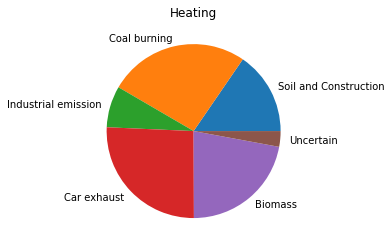

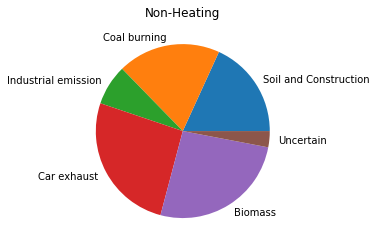

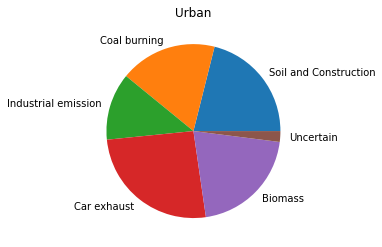

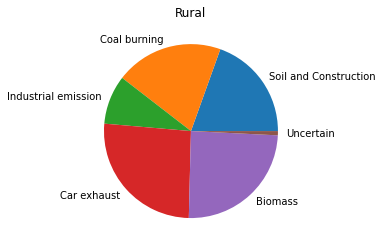

In [61]:
for dataframe,samplename in zip([df, df1, df2, df3], ['Heating', 'Non-Heating', 'Urban', 'Rural']):
    plt.figure()
    plt.pie(dataframe['Percentage'], labels = dataframe.index)
    plt.title(samplename)
    plt.savefig('Figures/resultspie' + samplename + '.png', dpi = 900)

<ipython-input-64-e8cbd37409fa>:3: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  plt.pie(dataframe['Percentage'], labels = dataframe.index)


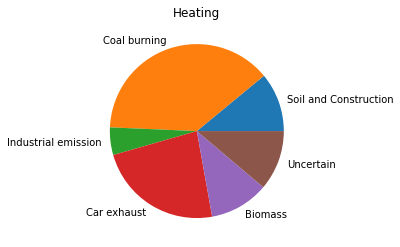

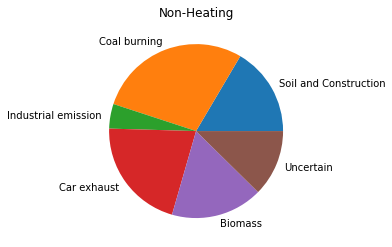

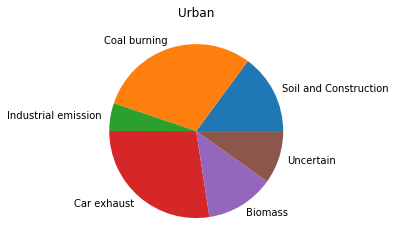

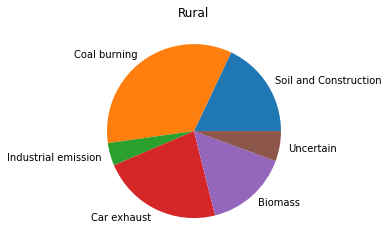

In [64]:
for dataframe,samplename in zip([df, df1, df2, df3], ['Heating', 'Non-Heating', 'Urban', 'Rural']):
    plt.figure()
    plt.pie(dataframe['Percentage'], labels = dataframe.index)
    plt.title(samplename)
    plt.savefig('Figures/multiresultspie' + samplename + '.png', dpi = 900)

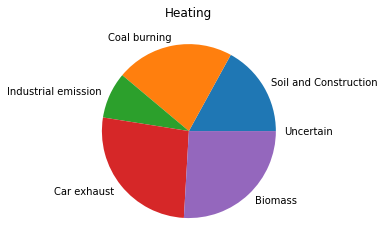

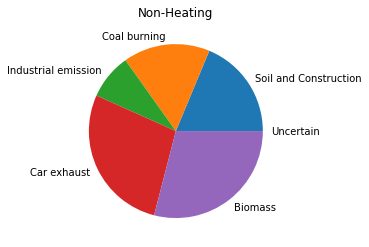

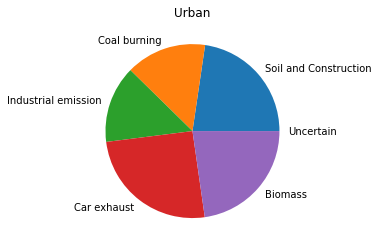

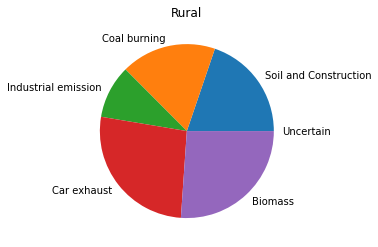

In [67]:
for dataframe,samplename in zip([df, df1, df2, df3], ['Heating', 'Non-Heating', 'Urban', 'Rural']):
    plt.figure()
    plt.pie(dataframe['Percentage'], labels = dataframe.index)
    plt.title(samplename)
    plt.savefig('Figures/singleresultspie' + samplename + '.png', dpi = 900)

In [48]:
df = sourceclustermax_edit(Qian2016, Sourcetraining, 0.2,  ELEMENTS)[0]
Qian2016results = []
for source in Predictedkeys:
    Qian2016results.append([source, len(df[df['Probable Source'] == source])/len(df),
    df[df['Probable Source'] == source]['Confidence'].mean(), df[df['Probable Source'] == source]['Confidence'].std()])
df = pd.DataFrame(Qian2016results, columns = ['labels', 'Percentage', 'Confidence mean', 'Confidence std'])
df.set_index('labels', inplace = True)

C:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
C:\Users\garre\anaconda3\lib\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

In [145]:
Sourcekeys.append('Uncertain')